<a href="https://colab.research.google.com/github/Partha16/myDataVizProjects/blob/main/worldPopulationViz.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install geopandas

     |████████████████████████████████| 1.0MB 6.6MB/s 
     |████████████████████████████████| 14.8MB 270kB/s 
     |████████████████████████████████| 6.5MB 36.3MB/s 


In [ ]:
!pip install --upgrade plotly

     |████████████████████████████████| 13.2MB 334kB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.express as px
import folium
import numpy as np

from shapely.geometry import Point

In [ ]:
shapefile = '/content/drive/MyDrive/Colab Notebooks/Map json/custom.geo (1).json'
map = gpd.read_file(shapefile)


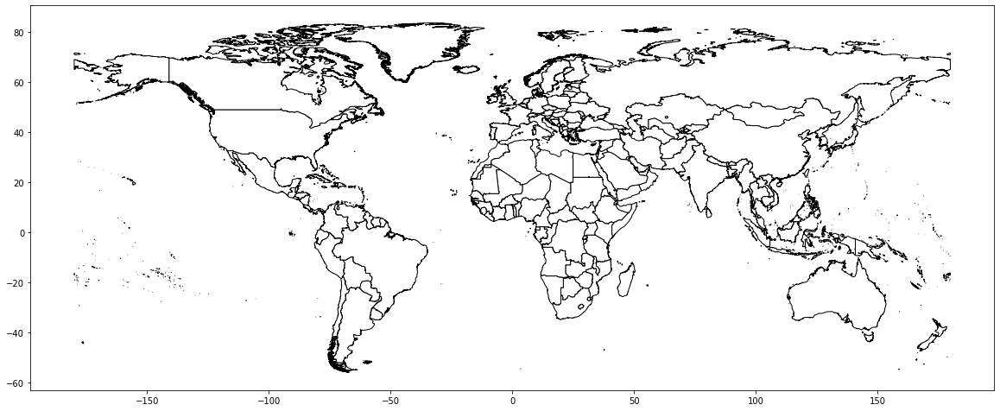

In [ ]:
map.plot(figsize = (20,10), color ='white', edgecolor='black')

In [ ]:
df = pd.read_excel('/content/drive/MyDrive/Excel Sheets/population_by_country_2020.xlsx')
df

,Country (or dependency),Population (2020),Yearly Change,Net Change,Density (P/Km²),Land Area (Km²),Migrants (net),Fert. Rate,Med. Age,Urban Pop %,World Share
0,China,1440297825,0.39 %,5540090,153,9388211,-348399.0,1.7,38,61 %,18.47 %
1,India,1382345085,0.99 %,13586631,464,2973190,-532687.0,2.2,28,35 %,17.70 %
2,United States of America,331341050,0.59 %,1937734,36,9147420,954806.0,1.8,38,83 %,4.25 %
3,Indonesia,274021604,1.07 %,2898047,151,1811570,-98955.0,2.3,30,56 %,3.51 %
4,Pakistan,221612785,2.00 %,4327022,287,770880,-233379.0,3.6,23,35 %,2.83 %
...,...,...,...,...,...,...,...,...,...,...,...
230,Montserrat,4993,0.06 %,3,50,100,NaN,N.A.,N.A.,10 %,0.00 %
231,Falkland Islands,3497,3.05 %,103,0,12170,NaN,N.A.,N.A.,66 %,0.00 %
232,Niue,1628,0.68 %,11,6,260,NaN,N.A.,N.A.,46 %,0.00 %
233,Tokelau,1360,1.27 %,17,136,10,NaN,N.A.,N.A.,0 %,0.00 %


In [ ]:
map.columns= map.columns.str.replace('admin','Country (or dependency)')
map = map.merge(df, how='outer', on='Country (or dependency)')

In [ ]:
m = folium.Map(location=[20,0], zoom_start=2)
map_3 = map.nlargest(3,'Population (2020)')
folium.GeoJson(map_3, name='geojson').add_to(m)

folium.Marker(
    location=[28.632429, 77.218788], 
    tooltip="India - 1382345085 (2nd Largest Population)",
    icon=folium.Icon(color="blue")
).add_to(m)

folium.Marker(
    location= [38.907192,-77.036873],
    tooltip="USA - 331341050 (3rd Largest Population)",
    icon=folium.Icon(color="blue", icon="info-sign")
).add_to(m)

folium.Marker(
    location= [39.904202,116.407394],
    tooltip="China - 1440297825 (1st Largest Population)",
    icon=folium.Icon(color="blue", icon="info-sign")
).add_to(m)

folium.Circle(
      location=[28.632429, 77.218788],
      popup='India',
      radius=1382345085/1000,
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(m)
folium.Circle(
      location=[38.907192,-77.036873],
      popup='USA',
      radius=331341050/1000,
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(m)
folium.Circle(
      location=[39.904202,116.407394],
      popup='China',
      radius=1440297825/1000,
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(m)
m

Above map shows the top three countries with the highest population, here the sizer of the circle shows the population

In [1]:
map_asia = map[map["continent"]=='asia']
fig, ax = plt.subplots(figsize=(20,17))
map_asia[map_asia["Density (P/Km²)"]<1000].plot(column='Density (P/Km²)', ax=ax, legend=True , colormap='pink')

TypeError: ignored

The above map shows the density of all asian countries, here we have excluded city states like Hong Kong as they have a very high population density and will skew the legend and the saturation of other countries.

No handles with labels found to put in legend.


<function matplotlib.pyplot.show>

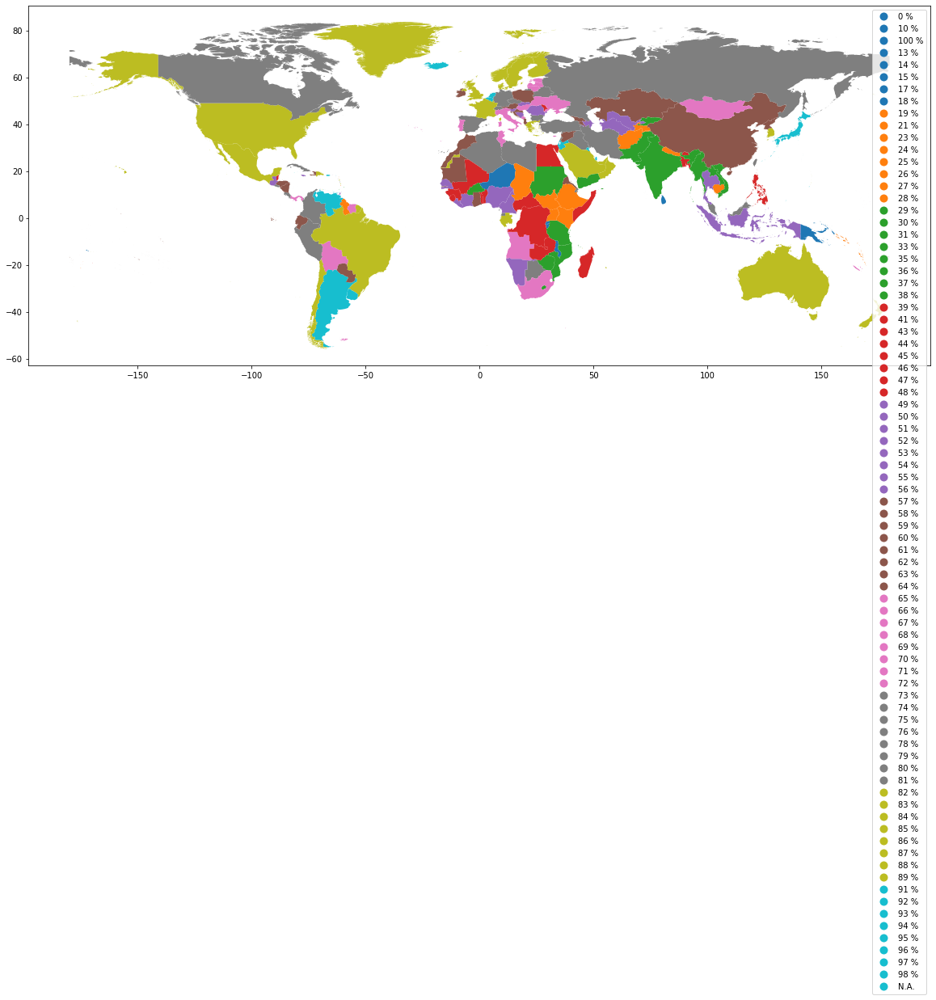

In [ ]:
fig, ax = plt.subplots(figsize=(20,17))
ax.legend(loc="lower left",ncol=len(map.columns))
map.plot(column='Urban Pop %', ax=ax, legend=True )

plt.show

The above map shows the urban population percentage country wise and you can see that Niger and Papua new guineau has the lowest amount of urbanization.

In [ ]:
import os

map_asia = map[map['continent']=='Asia']
m = folium.Map(location=[38.305542, -30.384108], zoom_start=4)


bins = list(map["Land Area (Km²)"].quantile([0,0.2,0.4,0.6,0.8,1]))

country_geo = os.path.join('/content/drive/MyDrive/Colab Notebooks/Map json/world-countries.json')

folium.Choropleth(
    geo_data=country_geo,
    name="choropleth",
    data=map,
    columns=["Country (or dependency)", "Land Area (Km²)"],
   key_on="feature.properties.name",
    fill_color="BuPu",
    fill_opacity=0.7,
   line_opacity=0,
    legend_name="Land Area (Km²)",
    bins = bins,

).add_to(m)

folium.LayerControl().add_to(m)

m

The above sepeartes countries into a saturation of purple based on their land area. Big countries are very saturated in purple and small countries are less saturated. Some countries like Serbia have a problem with defining land area as there comes a problem of whether to take into account Kososvo or not which is a controversial issue in geopolitics.

In [ ]:
m = folium.Map(location=[20,0], zoom_start=2,tiles='CartoDB dark_matter')
map_nom = map[map['Migrants (net)']<0] 
folium.GeoJson(map_nom, name='geojson').add_to(m)
m

The above map shows the countries whose net migration is lower than 0 i.e, the number of migrants going out of the country is higher than migrants coming in.
Here migrants means not only refugees but migrants that come in volunatrily.
That is why India is highlighted in this map even though India accepts a lot of Bangladeshi immigrants into the state of Assam and West Bengal. It can also be seen that most Western Countries have net positive immigrants.